# FusionTransformer — from data to (x, y)

Runs the **Stage B+C fusion pipeline** end to end on a *chosen* dataset:
async multi-modal sensor windows → per-modality encoders → one set-transformer
→ calibrated `(x, y)`.

**One token, one transformer, three attentions** — self (cross-modal), self
(temporal), cross (readout). Robustness to missing modalities is a property of
*training* (modality + instant dropout + a padding mask), not of the
architecture — so the same pipeline runs on any dataset, using only the
modalities that dataset actually has.

## What changed in the 2026-05-20 audit

This notebook still works as-is, but it now produces different (and more honest) numbers because of pipeline changes documented in `handoff/HANDOFF_LOG.md`. The key updates that affect what you see below:

1. **Metric unified** — `val_mae` is Euclidean (meters) everywhere, matching the `euclidean_mae` helper. Old encoder eval reports used component-wise L1 — those numbers were ~1.4× smaller than equivalent Euclidean ones.
2. **`_intra` splits are leaky** — train and val are random chunks of the same continuous walk. Use `configs/data/ipin2024_floor-2.yaml`, `imuwifine.yaml`, `ronin_a000.yaml` (trial-out) for honest evaluation. `_intra` configs are now marked `LEAKY — DEV USE ONLY`.
3. **Baselines exist now** — `scripts/baselines.py` writes `runs/baselines/<dataset>/baselines.json`. The post-fit diagnostics block (printed after `fit()`) compares fusion against these and tags `[PASS]`/`[FAIL]`.
4. **Encoder targets** — IMU and Odom can be trained with `target_mode='displacement'` via `EncoderTrainer`. Position-target Stage A was the encoder-memorization bug.
5. **`odom_x` / `odom_y` removed from `ODOM_COLS`** — they were the target leaking into the input. `OdomCNN(in_features=5)` is the new default.
6. **Fusion now actually fuses (in principle)** — `modality_dropout` raised 0.16 → 0.4; `modality_balanced_loss: true` in `configs/stage_c/fusion.yaml`. Post-fit subsets table flags `<- UNUSED` modalities automatically.
7. **Pretrained Stage A loading** — `build_encoders(..., pretrained_paths={mod: encoder.pt})` or `cfg.stage_a.pretrained.<mod>` plugs Stage A checkpoints into fusion.

Run `scripts/baselines.py --skip-leaky` before training so the post-fit diagnostics can show baseline gaps.

In [31]:
import sys, json, warnings
from pathlib import Path

ROOT = Path.cwd().parent if Path.cwd().name == 'notebooks' else Path.cwd()
sys.path.insert(0, str(ROOT))
warnings.filterwarnings('ignore')

import numpy as np
import torch
import matplotlib.pyplot as plt
from omegaconf import OmegaConf

from src.pipeline.fusion.builder import (
    available_datasets, load_config, build_datamodule, build_encoders,
    extract_vision_tokens, build_model, build_trainer)
from src.pipeline.uncertainty import ConformalPosition

torch.manual_seed(0)
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print('device:', DEVICE)
print('available datasets:', available_datasets())

device: cuda
available datasets: ['imuwifine', 'ipin2024_floor-2', 'ipin2024_floor-2_intra', 'ipin2024_floor0', 'ronin_a000', 'ronin_a000_intra', 'simulation']


## 0 · Choose a dataset

Set `DATASET` below to any name printed above and re-run — every step adapts to
the modalities that dataset has.

**Why this matters.** The Webots **simulation** has no real WiFi: its RSSI was
produced by a Gaussian-Process regressor fitted to real-world measurements, and
queried during data collection. So a model trained on simulation WiFi is partly
learning from *another model's predictions* — its WiFi accuracy is optimistic.
The **IMUWiFine / IPIN 2024 / RoNIN** datasets are real-world recordings; running
the exact same pipeline on them is the honest test.

**Split type matters for WiFi.** Real RSSI is *session-specific* (AP power,
device, and the set of visible APs drift between recordings):

- *within-session* splits — `ronin_a000_intra`, `ipin2024_floor-2_intra` — train
  and validation come from the same sequences, so WiFi transfers and the model
  genuinely learns (≈ 10–13 m on real data — far above simulation's ≈ 0.4 m,
  which is the GPR-WiFi bias laid bare).
- *cross-session* splits — `ipin2024_floor0`, `imuwifine` — train and validation
  are different recordings; the model **fits train but validation diverges**
  (train loss ↓ while val MAE ↑). That is not a pipeline bug — it is the honest
  measurement that WiFi fingerprints do not transfer across sessions.

In [ ]:
DATASET = 'ronin_a000'   # 'simulation' | 'imuwifine' | 'ipin2024_floor0' | 'ronin_a000_intra'

cfg = load_config(DATASET)
MODS = list(cfg.dataset.modalities)
print(f"dataset   : {cfg.dataset.selected}")
print(f"source    : {cfg.dataset.source}")
print(f"modalities: {MODS}")
print(f"paths     : {len(cfg.dataset.split.train_paths)} train / "
      f"{len(cfg.dataset.split.val_paths)} val / "
      f"{len(cfg.dataset.split.test_paths)} test")

dataset   : ipin2024_floor-2
source    : ipin2024
modalities: ['wifi', 'imu']
paths     : 11 train / 4 val / 4 test


## 1 · Config

Model / training / temporal knobs come from `configs/stage_c/fusion.yaml`;
the dataset block (modalities, split, WiFi-PCA, windows) from
`configs/data/<dataset>.yaml`.

In [33]:
print('--- model / train / temporal ---')
print(OmegaConf.to_yaml({'model': cfg.model, 'train': cfg.train,
                         'temporal': cfg.temporal}))
print('--- dataset ---')
print(OmegaConf.to_yaml({k: cfg.dataset[k] for k in
                        ('modalities', 'preprocessing', 'windows')
                        if k in cfg.dataset}))

--- model / train / temporal ---
model:
  embed_dim: 128
  depth: 6
  n_heads: 4
  ff_mult: 4
  dropout: 0.1
  use_time: true
  readout: query
train:
  lr: 0.0013
  weight_decay: 0.0001
  huber_delta: 0.5
  grad_clip: 1.0
  patience: 40
  epochs: 90
  modality_dropout: 0.4
  instant_dropout: 0.45
  modality_balanced_loss: true
  modality_balanced_weight: 0.5
temporal:
  n_instants: 8
  instant_stride: 9

--- dataset ---
modalities:
- wifi
- imu
preprocessing:
  normalize: true
  wifi_pca: 128
windows:
  imu: 32
  wifi: 1



## 2 · Data — async multi-modal windows

Each sample is anchored to a ground-truth timestamp; for that instant the
`FusionDataset` gathers the most recent window of every available modality.

In [34]:
dm = build_datamodule(cfg)
print(dm.summary())

Fusion DataModule Summary
  Train: 9940 samples
  Val: 10718 samples
  Test: 14824 samples
  Modalities: ['wifi', 'imu']
  Feature dims: {'wifi': 128, 'imu': 9}
  Windows: {'wifi': 1, 'imu': 32}
  WiFi PCA: 166 -> 128 dims (100.0% variance)
  wifi mean range: [-0.000, 0.000]
  wifi std range:  [0.000, 40.850]
  imu mean range: [-4.747, 54.400]
  imu std range:  [0.226, 101.749]


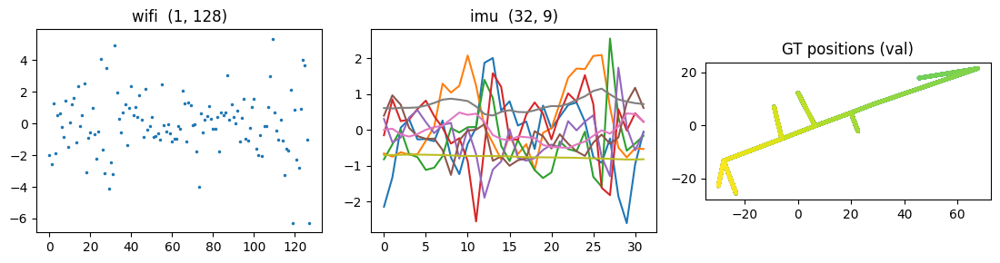

In [35]:
# One sample's windows + the GT positions, for whatever modalities exist
s = dm.train_ds[min(200, len(dm.train_ds) - 1)]
tab = [m for m in MODS if m != 'camera']
ncol = len(tab) + (1 if 'camera' in MODS else 0) + 1
fig, ax = plt.subplots(1, ncol, figsize=(3.7 * ncol, 3))
ax = np.atleast_1d(ax)
i = 0
for m in tab:
    w = s[m].numpy()
    (ax[i].plot(w.reshape(-1), '.', ms=3) if m == 'wifi' else ax[i].plot(w))
    ax[i].set_title(f'{m}  {tuple(w.shape)}'); i += 1
if 'camera' in MODS:
    cam = s['camera'][-1].permute(1, 2, 0).numpy()
    cam = (cam - cam.min()) / (np.ptp(cam) + 1e-9)
    ax[i].imshow(cam); ax[i].set_title('camera'); ax[i].axis('off'); i += 1
t = dm.val_ds._targets.numpy()
ax[i].scatter(t[:, 0], t[:, 1], s=5, c=range(len(t)), cmap='viridis')
ax[i].set_title('GT positions (val)'); ax[i].set_aspect('equal')
plt.tight_layout(); plt.show()

## 3 · Encoders — each modality → a 128-d token

Every Stage-A encoder maps its window to one 128-d vector. WiFi width adapts to
the dataset (raw 117-d for simulation, PCA-reduced 128-d for the real datasets).
If the dataset has a camera, the DPVO motion encoder's frozen patch tokens are
cached once.

In [36]:
encoders, vision = build_encoders(cfg, dm)
print('encoders:', {m: type(e).__name__ for m, e in encoders.items()})
extra = extract_vision_tokens(dm, vision, DEVICE) if vision is not None else None

X = {m: dm.train_ds.get_tensors(m)[0] for m in MODS if m != 'camera'}
for m in MODS:
    if m == 'camera':
        print(f'camera   DPVO patch tokens {tuple(extra["camera"]["train"].shape[1:])}'
              f' -> motion head -> (B, 128)')
    else:
        with torch.no_grad():
            z = encoders[m](X[m][:4])
        print(f'{m:8s} window {tuple(X[m].shape[1:])!s:12s} -> token {tuple(z.shape)}')
print('\ntoken = encoder_embedding + modality_embedding + time_encoding(dt)')

encoders: {'wifi': 'Anchor2Vec', 'imu': 'IMUCNN'}
wifi     window (1, 128)     -> token (4, 128)
imu      window (32, 9)      -> token (4, 128)

token = encoder_embedding + modality_embedding + time_encoding(dt)


## 4 · The FusionTransformer

A set-transformer over the modality tokens. One instant → self-attention is
purely cross-modal; K instants → the same layers also attend across time; a
cross-attention `PositionQuery` reads out `(x, y)`.

In [37]:
demo = build_model(cfg, build_encoders(cfg, dm)[0])
n_p = sum(p.numel() for p in demo.parameters())
print(f'FusionTransformer: {n_p/1e6:.2f}M params  '
      f'(depth={cfg.model.depth}, heads={cfg.model.n_heads}, readout={cfg.model.readout})')
print(f'modalities fused: {MODS}')

FusionTransformer: 1.38M params  (depth=6, heads=4, readout=query)
modalities fused: ['wifi', 'imu']


## 5 · Train — single-instant fusion

Self-attention over one instant's tokens, trained with **modality dropout** so it
learns to predict from any subset of sensors.

In [38]:
si_model = build_model(cfg, build_encoders(cfg, dm)[0])
si = build_trainer(cfg, si_model, dm, extra_inputs=extra, n_instants=1)
si_hist = si.fit(epochs=60)

  Epoch   0/60  train=11.0367  val=8.2565  val_mae=26.400m  lr=6.15e-05  *
  Epoch  10/60  train=5.2222  val=10.2365  val_mae=32.273m  lr=8.90e-04  
  Epoch  20/60  train=4.1377  val=9.0327  val_mae=28.808m  lr=1.28e-03  
  Epoch  30/60  train=2.6266  val=8.7519  val_mae=28.273m  lr=1.02e-03  
  Epoch  40/60  train=3.0972  val=9.1725  val_mae=29.306m  lr=5.53e-04  
  Epoch  50/60  train=2.1115  val=7.8958  val_mae=25.071m  lr=1.41e-04  
  Epoch  59/60  train=2.5527  val=7.8916  val_mae=25.037m  lr=5.51e-09  
  Done in 177.9s — best val MAE: 24.783m (epoch 51)

  Post-fit diagnostics
  ----------------------------------------------------------------------
    all             MAE=24.783m  RMSE=32.440m
    only:wifi       MAE=24.806m  RMSE=32.584m
    only:imu        MAE=29.754m  RMSE=36.905m

  Baselines on this dataset (val):
    mean_train_pos  MAE=25.662m  (fusion - baseline = -0.878m, BEATEN by fusion)
    wifi_knn        MAE=32.340m  (fusion - baseline = -7.556m, BEATEN by fusion)
 

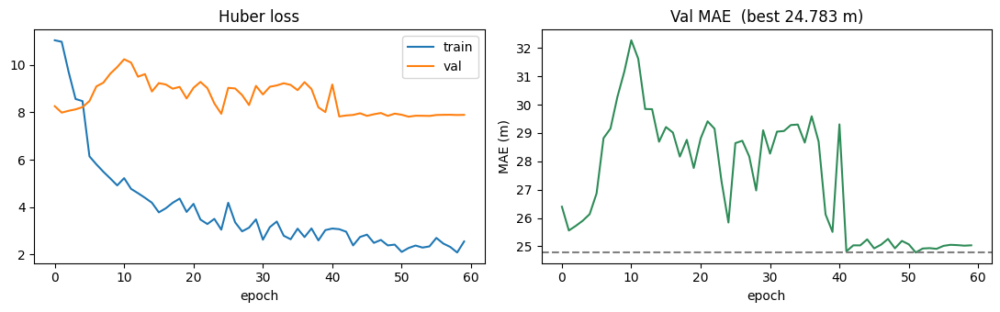

In [39]:
fig, ax = plt.subplots(1, 2, figsize=(11, 3.5))
ax[0].plot(si_hist.train_loss, label='train'); ax[0].plot(si_hist.val_loss, label='val')
ax[0].set_title('Huber loss'); ax[0].set_xlabel('epoch'); ax[0].legend()
ax[1].plot(si_hist.val_mae, color='seagreen')
ax[1].axhline(si_hist.best_val_mae, ls='--', color='gray')
ax[1].set_title(f'Val MAE  (best {si_hist.best_val_mae:.3f} m)')
ax[1].set_xlabel('epoch'); ax[1].set_ylabel('MAE (m)')
plt.tight_layout(); plt.show()

## 6 · Every modality combination

With M modalities there are 2ᴹ−1 non-empty subsets. The model — trained with
modality dropout — is evaluated on all of them. WiFi carries the absolute
position signal; the others are motion sensors, strong as helpers but weak alone.

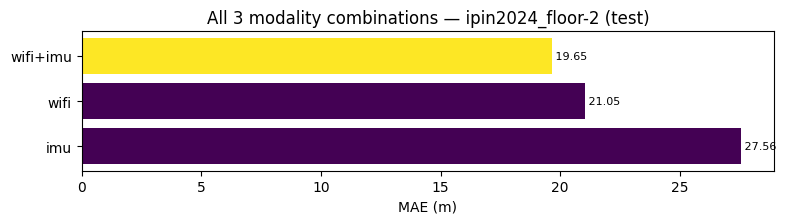

In [40]:
EVAL_SPLIT = 'test' if dm.test_ds is not None else 'val'
allsub = si.evaluate_all_subsets(EVAL_SPLIT)
items = sorted(allsub.items(), key=lambda kv: kv[1]['mae'])
names = [k for k, _ in items]
maes = [v['mae'] for _, v in items]
ncol = [v['n_modalities'] for _, v in items]
span = max(1, len(MODS) - 1)
colors = plt.cm.viridis([(c - 1) / span for c in ncol])
plt.figure(figsize=(8, 0.45 * len(names) + 1))
plt.barh(range(len(names)), maes, color=colors)
plt.yticks(range(len(names)), names); plt.gca().invert_yaxis()
plt.xlabel('MAE (m)')
plt.title(f'All {len(names)} modality combinations — {cfg.dataset.selected} (test)')
for i, v in enumerate(maes):
    plt.text(v, i, f' {v:.2f}', va='center', fontsize=8)
plt.tight_layout(); plt.show()

## 7 · Temporal fusion — and the staleness story

K recent instants let the *same* transformer attend across time. Trained with
**instant dropout** (individual instant-modality tokens dropped) — which
regularises the larger token set and forces motion propagation instead of
leaning on the freshest WiFi scan.

In [41]:
tmp_model = build_model(cfg, build_encoders(cfg, dm)[0])
tmp = build_trainer(cfg, tmp_model, dm, extra_inputs=extra)  # config: temporal + query
tmp_hist = tmp.fit(epochs=cfg.train.epochs)

  Epoch   0/90  train=10.9592  val=8.2525  val_mae=26.247m  lr=5.62e-05  *
  Epoch  10/90  train=3.9393  val=8.8192  val_mae=28.370m  lr=4.97e-04  
  Epoch  20/90  train=2.8120  val=8.6438  val_mae=27.743m  lr=1.15e-03  
  Epoch  30/90  train=2.6893  val=8.1602  val_mae=26.159m  lr=1.29e-03  
  Epoch  40/90  train=2.3818  val=8.5961  val_mae=27.564m  lr=1.15e-03  
  Epoch  50/90  train=1.9931  val=9.3232  val_mae=29.758m  lr=8.87e-04  
  Epoch  60/90  train=1.9653  val=9.7073  val_mae=31.067m  lr=5.69e-04  
  Epoch  66/90  train=2.0805  val=9.6286  val_mae=30.851m  lr=3.82e-04  
  Early stopping at epoch 66 (best=26)
  Done in 258.1s — best val MAE: 23.336m (epoch 26)

  Post-fit diagnostics
  ----------------------------------------------------------------------
    all             MAE=23.336m  RMSE=32.115m
    only:wifi       MAE=23.601m  RMSE=33.522m
    only:imu        MAE=32.056m  RMSE=39.262m

  Baselines on this dataset (val):
    mean_train_pos  MAE=25.662m  (fusion - baseline 

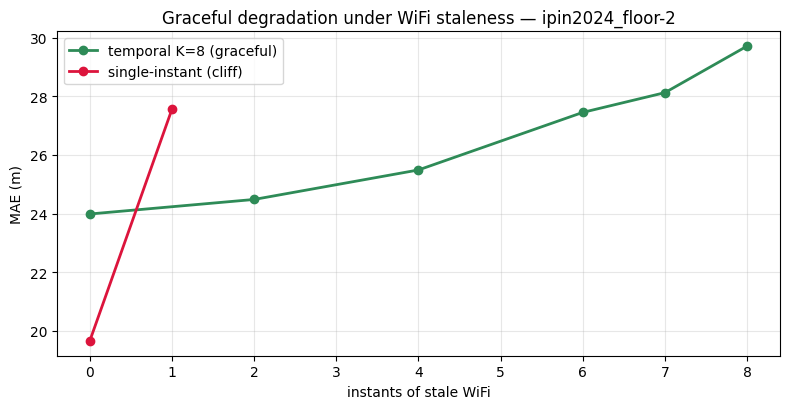

In [42]:
# WiFi masked at the N most-recent instants. A single-instant model only sees
# the anchor -> the moment WiFi is not fresh it falls to its no-WiFi error: a
# cliff. The temporal model dead-reckons and degrades gracefully.
EVAL_SPLIT = 'test' if dm.test_ds is not None else 'val'
ts = tmp.evaluate_staleness('wifi', EVAL_SPLIT)
ss = si.evaluate_staleness('wifi', EVAL_SPLIT)
tx = [int(k.split('=')[1]) for k in ts]; ty = [ts[k]['mae'] for k in ts]
sx = [int(k.split('=')[1]) for k in ss]; sy = [ss[k]['mae'] for k in ss]
plt.figure(figsize=(8, 4.2))
plt.plot(tx, ty, 'o-', color='seagreen', lw=2, label='temporal K=8 (graceful)')
plt.plot(sx, sy, 'o-', color='crimson', lw=2, label='single-instant (cliff)')
plt.xlabel('instants of stale WiFi'); plt.ylabel('MAE (m)')
plt.title(f'Graceful degradation under WiFi staleness — {cfg.dataset.selected}')
plt.legend(); plt.grid(alpha=.3); plt.tight_layout(); plt.show()

## 8 · Uncertainty — conformal prediction

Split-conformal yields a distribution-free radius: the true position lands inside
the disc with probability ≥ 1−α. The guarantee needs calibration and inference
data to be **exchangeable**, so we use random halves of the same test pool.

radius 54.940 m   target 90%   empirical 89.6%


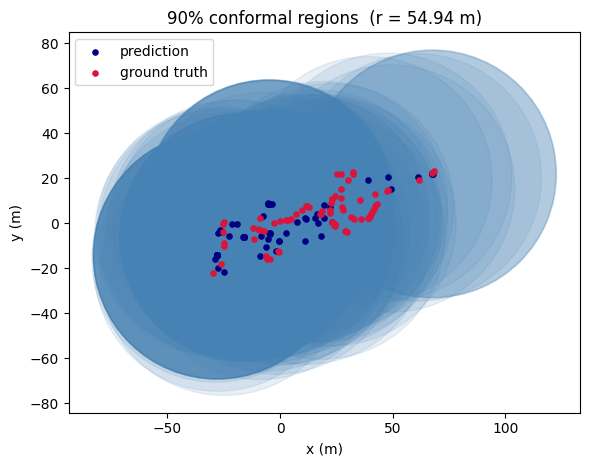

In [43]:
EVAL_SPLIT = 'test' if dm.test_ds is not None else 'val'
te_pred, te_tgt = tmp.predict(EVAL_SPLIT)
g = torch.Generator().manual_seed(0)
perm = torch.randperm(len(te_pred), generator=g)
cal, evl = perm[:len(perm) // 2], perm[len(perm) // 2:]

cp = ConformalPosition(alpha=cfg.conformal.alpha)
cp.calibrate(te_pred[cal], te_tgt[cal])
cov = cp.coverage(te_pred[evl], te_tgt[evl])
tgt_pct = (1 - cfg.conformal.alpha) * 100
print(f'radius {cp.radius:.3f} m   target {tgt_pct:.0f}%   empirical {cov*100:.1f}%')

P, G = te_pred[evl].numpy(), te_tgt[evl].numpy()
idx = np.linspace(0, len(P) - 1, 70).astype(int)
fig, ax = plt.subplots(figsize=(6, 5.5))
for i in idx:
    ax.add_patch(plt.Circle(P[i], cp.radius.item(), color='steelblue', alpha=.12))
ax.scatter(P[idx, 0], P[idx, 1], s=14, c='navy', label='prediction')
ax.scatter(G[idx, 0], G[idx, 1], s=14, c='crimson', label='ground truth')
ax.set_aspect('equal'); ax.legend()
ax.set_title(f'{tgt_pct:.0f}% conformal regions  (r = {cp.radius:.2f} m)')
ax.set_xlabel('x (m)'); ax.set_ylabel('y (m)')
plt.tight_layout(); plt.show()

## 9 · Watch a full validation path replay

Animates the trained fusion model's prediction against ground truth as it walks one validation path. The dashed line is the per-sample error vector; the on-screen counter shows the rolling mean error so far.

Why look at this in addition to the MAE numbers: a single number averages over the whole split, but trajectories tell you *where* the model fails. Common patterns to look for:

- **Lag**: predictions consistently trail GT. The model is averaging over too long a temporal window or relying on stale WiFi.
- **Corner-cutting**: predictions go straight at turns, GT curves. IMU/Odom motion isn't being used.
- **Anchor drift**: predictions hover near a few training-set centroids regardless of where GT goes. The model is doing fingerprinting, not localizing.
- **Clean tracking**: predictions follow GT within the conformal radius. The model is actually fusing.

Saves an `mp4` (if ffmpeg is on PATH) or a `gif` fallback to the trainer's run dir. Switch `which = si` to render the single-instant model instead.

In [44]:
import matplotlib as mpl
import matplotlib.animation as animation
from IPython.display import Image, Video, display
from matplotlib.patches import Circle as _Circle

# Point matplotlib at the ffmpeg binary bundled with imageio-ffmpeg
# (installed in the venv) so mp4 export works without a system ffmpeg.
try:
    import imageio_ffmpeg
    mpl.rcParams['animation.ffmpeg_path'] = imageio_ffmpeg.get_ffmpeg_exe()
except Exception as _e:
    print(f'imageio-ffmpeg not available ({_e}); will fall back to GIF')

# Pick which trained model to visualize. Default to the temporal
# fusion run since that's the more interesting trajectory; flip to
# `which = si` to render the single-instant model.
which = tmp

# Use the same split as the attribution cell: test when it exists, else val.
EVAL_SPLIT = 'test' if which.dm.test_ds is not None else 'val'
# Pick the longest path in that split. Set `target_path = <int>` to override.
val_ds = getattr(which.dm, f'{EVAL_SPLIT}_ds')
pid_counts: dict[int, int] = {}
for r in val_ds._gt_rows:
    pid_counts[r['path_id']] = pid_counts.get(r['path_id'], 0) + 1
target_path = max(pid_counts, key=pid_counts.get)
print(f'animating {EVAL_SPLIT} path_{target_path:02d} ({pid_counts[target_path]} samples)')

# Predictions over the full val split, then filter + sort by time.
val_pred, val_tgt = which.predict(EVAL_SPLIT)
val_pred = val_pred.numpy(); val_tgt = val_tgt.numpy()
idx = [i for i, r in enumerate(val_ds._gt_rows) if r['path_id'] == target_path]
times = np.array([val_ds._gt_rows[i]['time'] for i in idx])
order = np.argsort(times)
idx_sorted = [idx[k] for k in order]
P = val_pred[idx_sorted]; G = val_tgt[idx_sorted]
T = len(P)

# Conformal radius from cell 8 (if available) — overlay for context.
radius = float(cp.radius) if 'cp' in dir() else None

fig, ax = plt.subplots(figsize=(7, 7))
margin = 1.0
xmin = min(P[:, 0].min(), G[:, 0].min()) - margin
xmax = max(P[:, 0].max(), G[:, 0].max()) + margin
ymin = min(P[:, 1].min(), G[:, 1].min()) - margin
ymax = max(P[:, 1].max(), G[:, 1].max()) + margin
ax.set_xlim(xmin, xmax); ax.set_ylim(ymin, ymax)
ax.set_aspect('equal')
ax.set_xlabel('x (m)'); ax.set_ylabel('y (m)')
ax.set_title(f'{EVAL_SPLIT} path_{target_path:02d} ({cfg.dataset.selected}) — fusion prediction vs GT')
ax.grid(alpha=0.3)

# Ghosted full GT trajectory for spatial context.
ax.plot(G[:, 0], G[:, 1], color='gray', alpha=0.25, lw=1.2, label='full GT (ghost)')

# Dynamic artists.
gt_line, = ax.plot([], [], color='crimson', lw=2.0, label='GT so far')
pr_line, = ax.plot([], [], color='navy', lw=2.0, label='prediction so far')
gt_head, = ax.plot([], [], 'o', color='crimson', ms=10, label='current GT')
pr_head, = ax.plot([], [], 'o', color='navy', ms=10, label='current pred')
err_line, = ax.plot([], [], '--', color='black', alpha=0.55, lw=1.0, label='error vector')

# Optional conformal disk around the current prediction.
cone = None
if radius is not None:
    cone = _Circle((0, 0), radius, fill=False, color='steelblue',
                   alpha=0.7, lw=1.0,
                   label=f'{(1-cfg.conformal.alpha)*100:.0f}% conformal')
    ax.add_patch(cone)

ax.legend(loc='upper right', fontsize=8)
txt = ax.text(0.02, 0.98, '', transform=ax.transAxes, va='top',
              fontsize=10, family='monospace',
              bbox=dict(boxstyle='round', facecolor='white', alpha=0.85))

def init():
    for L in (gt_line, pr_line, gt_head, pr_head, err_line):
        L.set_data([], [])
    return gt_line, pr_line, gt_head, pr_head, err_line, txt

def update(i: int):
    gt_line.set_data(G[:i + 1, 0], G[:i + 1, 1])
    pr_line.set_data(P[:i + 1, 0], P[:i + 1, 1])
    gt_head.set_data(G[i:i + 1, 0], G[i:i + 1, 1])
    pr_head.set_data(P[i:i + 1, 0], P[i:i + 1, 1])
    err_line.set_data([G[i, 0], P[i, 0]], [G[i, 1], P[i, 1]])
    if cone is not None:
        cone.center = (float(P[i, 0]), float(P[i, 1]))
    err = float(np.linalg.norm(P[i] - G[i]))
    rolling = float(np.linalg.norm(P[:i + 1] - G[:i + 1], axis=1).mean())
    txt.set_text(f't = {i + 1:4d}/{T}\nerr  = {err:5.2f} m\nmean = {rolling:5.2f} m')
    return gt_line, pr_line, gt_head, pr_head, err_line, txt

anim = animation.FuncAnimation(fig, update, init_func=init, frames=T,
                               interval=80, blit=False)

# Save mp4 if ffmpeg is on PATH; otherwise fall back to GIF via pillow.
out_dir = ROOT / 'runs' / which.run_id
out_dir.mkdir(parents=True, exist_ok=True)
out_path = out_dir / 'predictions_replay.mp4'
try:
    anim.save(str(out_path), writer='ffmpeg', fps=12, bitrate=2400)
    saved = out_path
    print(f'saved -> {saved}')
except Exception as e:
    saved = out_path.with_suffix('.gif')
    anim.save(str(saved), writer='pillow', fps=12)
    print(f'ffmpeg unavailable ({type(e).__name__}: {e}); saved GIF -> {saved}')
plt.close(fig)

if saved.suffix == '.mp4':
    display(Video(str(saved), embed=True))
else:
    display(Image(filename=str(saved)))

animating val path_11 (3353 samples)
saved -> x:\navlori-fusion\runs\fusion_20260521_093623\predictions_replay.mp4


## 10 · Per-prediction modality attribution

For every prediction along a path, how much did the readout query attend to each modality? This is the per-sample version of the subset table — it shows *what the model actually used* for each `(x, y)` it produced. Requires `readout='query'` (the config default).

Read it like this:

- A modality's % is the cross-attention mass the `PositionQuery` placed on that modality's tokens (summed over the K instants).
- If one modality dominates every row (e.g. WiFi at ~85%), the model isn't fusing — it's leaning. That's the audit's central finding made visible.
- `CLS` mass is attention spent on the always-present class token; high CLS often means "fall back to the learned prior" (e.g. when sensors are stale).
- Watch how the split moves with error: motion modalities (IMU/Odom) often rise where the model tracks tightest.


  Per-prediction modality attribution — test path_15
     t(s)    err |   wifi     imu      CLS
  -----------------------------------------------
     0.00  3.37m |   0.0%  100.0%     0.0%
    28.80 72.47m |  54.9%   43.8%     1.4%
    57.60 14.01m |   0.0%  100.0%     0.0%
    86.40 40.21m |  22.9%   75.0%     2.0%
   115.20 21.83m |   0.0%  100.0%     0.0%
   144.00 44.70m |   2.4%   97.6%     0.0%
   172.80  8.12m |  38.8%   61.1%     0.1%
   201.60 18.06m |  45.2%   54.8%     0.0%
   230.40  6.03m |  73.2%   26.8%     0.0%
   259.20  5.70m |  28.7%   71.3%     0.1%
   288.00 23.93m |  92.8%    7.2%     0.0%
   316.80  8.27m |   2.4%   97.6%     0.0%
   345.60 37.55m |  75.0%   25.0%     0.0%
   374.40  4.09m |  15.5%   84.4%     0.1%
   403.20  8.30m |  34.3%   65.7%     0.1%
   432.00  5.26m |  21.9%   78.0%     0.1%
   460.80 12.06m |  66.6%   33.4%     0.0%
   489.60 14.00m |  75.0%   25.0%     0.0%
   518.40  9.62m |  73.7%   26.3%     0.0%
   547.20  3.58m |  50.8%   49.2%   

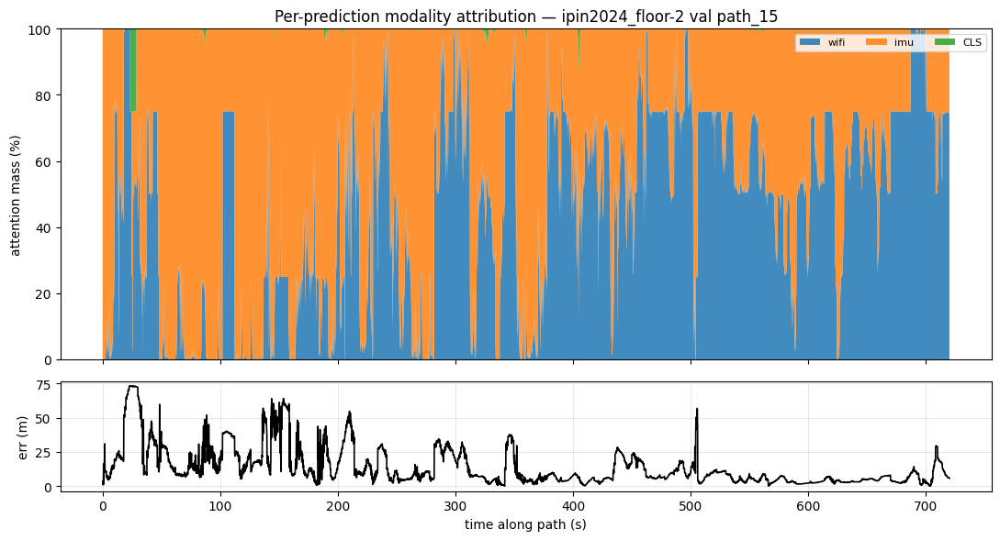

sequence-mean attention: {'wifi': 46.3, 'imu': 53.4} | CLS 0.3


In [45]:
# Longest val path by default (override target_path = <int>).
which = tmp
EVAL_SPLIT = 'test' if which.dm.test_ds is not None else 'val'
_ds = getattr(which.dm, f'{EVAL_SPLIT}_ds')
pid_counts = {}
for r in _ds._gt_rows:
    pid_counts[r['path_id']] = pid_counts.get(r['path_id'], 0) + 1
target_path = max(pid_counts, key=pid_counts.get)

# Logs a readable table to stdout AND writes attribution_<split>_path<id>.json
# to the run dir. Returns the per-sample records.
recs = which.log_attribution(EVAL_SPLIT, path_id=target_path,
                             max_samples=None, verbose=True)

# Stacked-area view of attention over the path + error overlay.
import numpy as _np
mods = which.modalities
t = _np.array([r['time'] for r in recs]); t = t - t[0]
err = _np.array([r['err_m'] for r in recs])
stack = _np.array([[r['attn_pct'][m] for m in mods] + [r['attn_cls_pct']]
                   for r in recs]).T  # (M+1, T)
labels = list(mods) + ['CLS']

fig, (axa, axe) = plt.subplots(2, 1, figsize=(11, 6), sharex=True,
                               gridspec_kw={'height_ratios': [3, 1]})
axa.stackplot(t, stack, labels=labels, alpha=0.85)
axa.set_ylabel('attention mass (%)'); axa.set_ylim(0, 100)
axa.legend(loc='upper right', ncol=len(labels), fontsize=8)
axa.set_title(f'Per-prediction modality attribution — {cfg.dataset.selected} '
              f'val path_{target_path:02d}')
axe.plot(t, err, color='black', lw=1.2)
axe.set_ylabel('err (m)'); axe.set_xlabel('time along path (s)')
axe.grid(alpha=0.3)
plt.tight_layout(); plt.show()

# One-line summary.
mean_attn = {m: round(float(_np.mean([r['attn_pct'][m] for r in recs])), 1)
             for m in mods}
print('sequence-mean attention:', mean_attn,
      '| CLS', round(float(_np.mean([r['attn_cls_pct'] for r in recs])), 1))

## 11 · Hyperparameter search — Optuna

`scripts/optuna_fusion.py --dataset <name>` runs a TPE search over the space in
the config. Results for whichever dataset was last searched load below.

study dataset: ?
best val MAE : 0.4089 m   (20 trials x 30 epochs)
  depth              6
  n_heads            4
  ff_mult            4
  dropout            0.035482327760679964
  lr                 0.0013093093704642082
  modality_dropout   0.15734131496361858
  instant_dropout    0.47233445852479194
  n_instants         8
  instant_stride     9


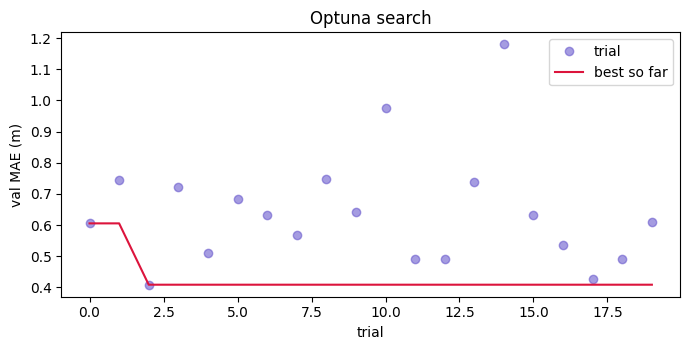

In [46]:
# Optuna writes per-dataset since Action 6: runs/optuna_fusion/<dataset>/
opt = ROOT / 'runs' / 'optuna_fusion' / cfg.dataset.selected
if (opt / 'best.json').exists():
    best = json.loads((opt / 'best.json').read_text())
    print(f"study dataset: {best.get('dataset', '?')}")
    print(f"best val MAE : {best['best_value_mae']:.4f} m   "
          f"({best['n_trials']} trials x {best['epochs_per_trial']} epochs)")
    for k, v in best['best_params'].items():
        print(f'  {k:18s} {v}')
    import pandas as pd
    df = pd.read_csv(opt / 'trials.csv')
    plt.figure(figsize=(7, 3.6))
    plt.plot(df['number'], df['value'], 'o', color='slateblue', alpha=.6, label='trial')
    plt.plot(df['number'], df['value'].cummin(), color='crimson', label='best so far')
    plt.xlabel('trial'); plt.ylabel('val MAE (m)'); plt.legend()
    plt.title(f'Optuna search — {cfg.dataset.selected}'); plt.tight_layout(); plt.show()
else:
    print(f'No study for {cfg.dataset.selected} yet — run:  '
          f'python scripts/optuna_fusion.py --dataset {cfg.dataset.selected}')

## Summary

- The **same pipeline** runs on any dataset — only `DATASET` changes; it uses
  whatever modalities that dataset has (4 for simulation, WiFi+IMU for the
  real-world datasets) and trains/evaluates within that dataset.
- **Self-attention** over modality tokens is the cross-modal fusion;
  **temporal self-attention** + **instant dropout** give graceful degradation
  under stale sensors; a **cross-attention query** reads out `(x, y)`.

**The WiFi-bias finding (running the pipeline across datasets):**

| Dataset | WiFi source | Split | Single-instant MAE |
|---|---|---|---|
| simulation | GPR-synthesised | cross-path | ≈ 0.4 m |
| ronin_a000_intra | real | within-session | ≈ 10 m |
| ipin2024_floor-2_intra | real | within-session | ≈ 13 m |
| ipin2024_floor0 / imuwifine | real | cross-session | diverges (no transfer) |

The simulation's sub-metre WiFi accuracy is **optimistic**: its RSSI is the
smooth output of a Gaussian-Process model, so it is far more learnable than
genuine RSSI. On real recordings the same fusion pipeline lands at ≈ 10–13 m
within a session, and **cannot localise at all across sessions** — real WiFi
fingerprints do not transfer (the train-loss-down / val-MAE-up signature).

This does not break the architecture — the set-transformer, temporal fusion and
conformal calibration all still work. It says the *bottleneck is the WiFi
representation*, not the fusion: cross-session robustness needs a session-invariant
WiFi encoder (AP-set–agnostic features, RSSI calibration), which is a Stage-A
problem, not a fusion-head problem.